In [1]:
import scanpy as sc
import matplotlib.pyplot as plt
import scvelo as scv
import scFates as scf
scv.set_figure_params(figsize=(3,3))
scf.set_figure_pubready()

In [2]:
adata=sc.read("data/adata_QC_leiden.h5ad")

In [3]:
adata.obs.plates.cat.categories

Index(['SS2_15_0073', 'SS2_15_0085', 'SS2_15_0086', 'SS2_15_0087',
       'SS2_15_0088-2', 'SS2_15_0168', 'SS2_15_0169', 'SS2_15_0170',
       'SS2_15_0171', 'SS2_15_0173', 'SS2_16_026', 'SS2_16_027', 'SS2_16_032',
       'SS2_16_249-2', 'SS2_16_250-2', 'SS2_16_258-2', 'SS2_16_384',
       'SS2_16_634', 'SS2_16_688', 'SS2_16_769', 'SS2_17_432', 'SS2_17_433',
       'SS2_17_528', 'SS2_17_552', 'SS2_18_107', 'SS2_18_108', 'SS2_18_109',
       'SS2_19_322', 'SS2_19_324', 'SS2_19_338', 'SS2_19_340', 'SS2_19_342',
       'SS2_19_344', 'SS2_19_346', 'SS2_19_348', 'SS2_19_350', 'SS2_19_352',
       'SS2_19_358', 'SS2_19_360', 'SS2_19_362', 'SS2_19_364', 'SS2_19_366',
       'SS2_19_372', 'SS2_19_374', 'SS2_20_079', 'SS2_20_081', 'SS2_20_083',
       'SS2_20_085', 'SS2_20_087', 'SS2_20_089'],
      dtype='object')

In [4]:
adata.obs[["Sox10","Isl1"]]=adata[:,["Sox10","Isl1"]].X.A
import numpy as np
selection=np.array([2,31,14,11,8,29,9,27,19,6,28,37,36,4,17,7,5,13,24],dtype=str)
adata.obs["selection"]=adata.obs.leiden.isin(selection).astype(str)

In [5]:
import matplotlib.font_manager as font_manager
font = font_manager.FontProperties(family='Arial',
                                   style='italic',
                                   size=9)

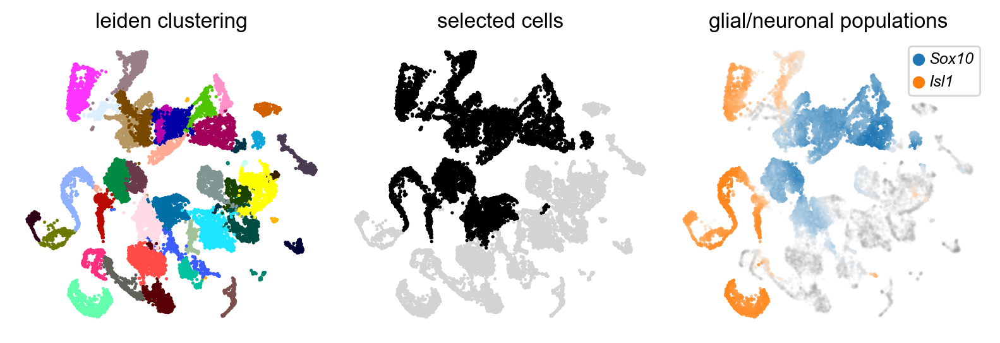

In [6]:
scv.set_figure_params(figsize=(2.6,2.6),dpi_save=300)
fig, axs = plt.subplots(1,3,figsize=(2.6*3,2.6),constrained_layout=True)
scv.pl.umap(adata,color="leiden",legend_loc="none",title="leiden clustering",
            ax=axs[0],show=False)
scv.pl.umap(adata,color="selection",groups=["True"],palette=["grey","k"],
            legend_loc="none",title="selected cells",ax=axs[1],show=False)
scv.pl.scatter(adata,basis="X_umap",color_gradients=["Sox10","Isl1"],legend_loc="best",
               smooth=True, perc=[5, 95],title="glial/neuronal populations",
               ax=axs[2],show=False);
axs[2].legend(prop=font)
plt.savefig("figures/suppfile1_1-A.pdf")

In [7]:
markers={"Neural tube and placodes":["Olig3","Sox2","Msx1"],
         "Red blood cells":"Ermap",
         "Mesenchyme":["Prrx1","Prrx2"],
         "Macrophage/Microglia":"Aif1",
         "Hematopoietic cells":"Vav1",
         "Adrenal cortex":["Star","Hsd3b1"],
         "Endothelium":["Kdr","Pecam1"],
         "Epithelial cells": ["Epcam","Krt8","Krt18"],
         "Bone-forming cells":"Sp7"}

In [8]:
celltypes=list(markers.keys())

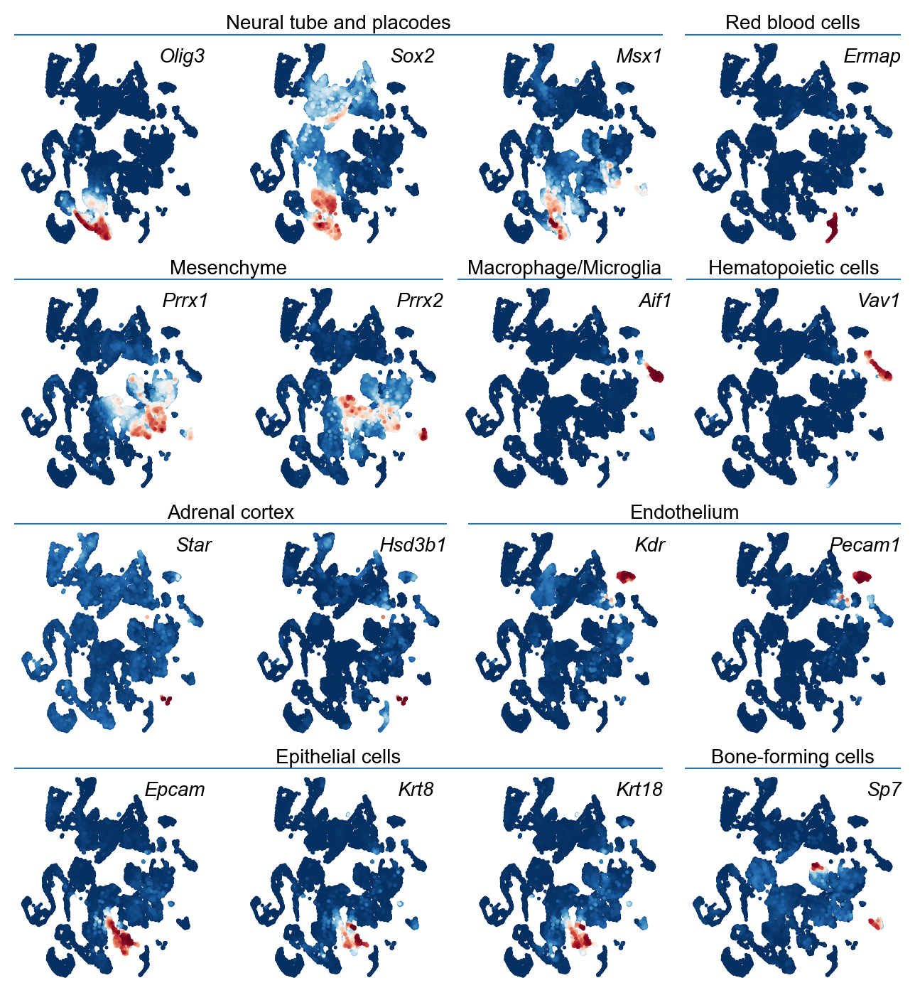

In [9]:
scv.set_figure_params(figsize=(2.6,2.6),dpi_save=300)
import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(8,9))
def set_title(ax,title):
    ax.text(0.5, 0.1, title, va="bottom", ha="center",fontsize=10)
    ax.axis("off")
    ax.axhline(0)
    
def plot_marker(ax,g):
    scv.pl.umap(adata,color=g,colorbar=False,
                smooth=True,perc=[1,99],title="",show=False,ax=ax)
    ax.text(1, 0.9,g,fontsize= 10,
                va="center", ha="right", transform=ax.transAxes,
                fontdict={"fontstyle":"italic"})
    
def plot_multi(celltype,gs):
    gs000 = gridspec.GridSpecFromSubplotSpec(2, 1,subplot_spec=gs,height_ratios=[1,10],hspace=0)
    axt= fig.add_subplot(gs000[0])   
    set_title(axt,celltype)
    ncol=len(markers[celltype])
    gs0000 = gridspec.GridSpecFromSubplotSpec(1, ncol,subplot_spec=gs000[1])
    axt=[]
    for c in range(gs0000.ncols):
        axt.append(fig.add_subplot(gs0000[c]))
        plot_marker(axt[c],markers[celltype][c])
        
def plot_single(celltype,gs):
    gs000 = gridspec.GridSpecFromSubplotSpec(2, 1,subplot_spec=gs,height_ratios=[1,10],hspace=0)    
    axt= fig.add_subplot(gs000[0])   
    set_title(axt,celltype)    
    axt = fig.add_subplot(gs000[1])
    plot_marker(axt,markers[celltype])
        
gs0 = gridspec.GridSpec(4, 1, figure=fig,hspace=0.025)
ix=0
## first row
lens=[[3,1],[2,1,1],[2,2],[3,1]]

for i,rlen in enumerate(lens):
    gs00 = gridspec.GridSpecFromSubplotSpec(1, len(rlen), width_ratios=rlen,subplot_spec=gs0[i],wspace=0.05)
    for j,l in enumerate(rlen):
        if l >1:
            plot_multi(celltypes[ix],gs00[j])
            ix=ix+1
        else:
            plot_single(celltypes[ix],gs00[j])
            ix=ix+1



plt.savefig("figures/suppfile1_1-B.pdf",bbox_inches="tight")

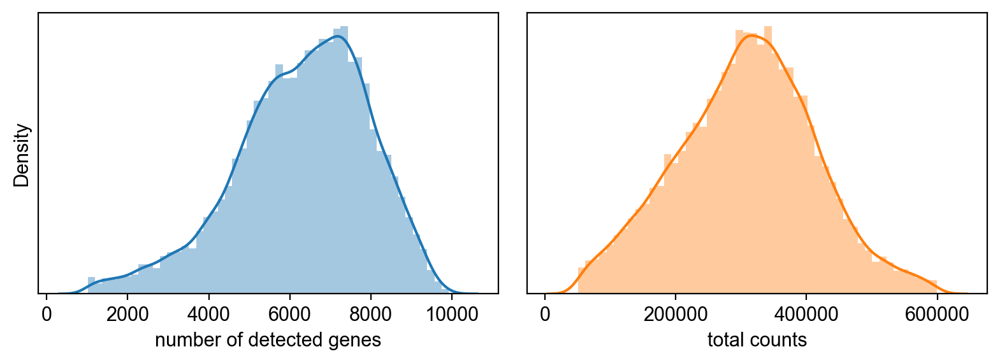

In [10]:
import seaborn as sns
custom_palette = sns.color_palette()
qc=adata.obs
fig, axes = plt.subplots(1, 2,figsize=(8, 3))
sns.distplot(qc.n_genes_by_counts,ax=axes[0])
axes[0].set_xlabel("number of detected genes")
sns.distplot(qc.total_counts,ax=axes[1],color=custom_palette[1])
plt.xlabel("total counts")
plt.ylabel("")
axes[0].set_yticks([])
axes[1].set_yticks([])
plt.ticklabel_format(axis="x",style="sci")
plt.tight_layout()
plt.savefig("figures/suppfile1_2-A.pdf",dpi=300)

In [11]:
adata=sc.read("data/adata_glia_prefilter.h5ad")

In [12]:
import seaborn as sns

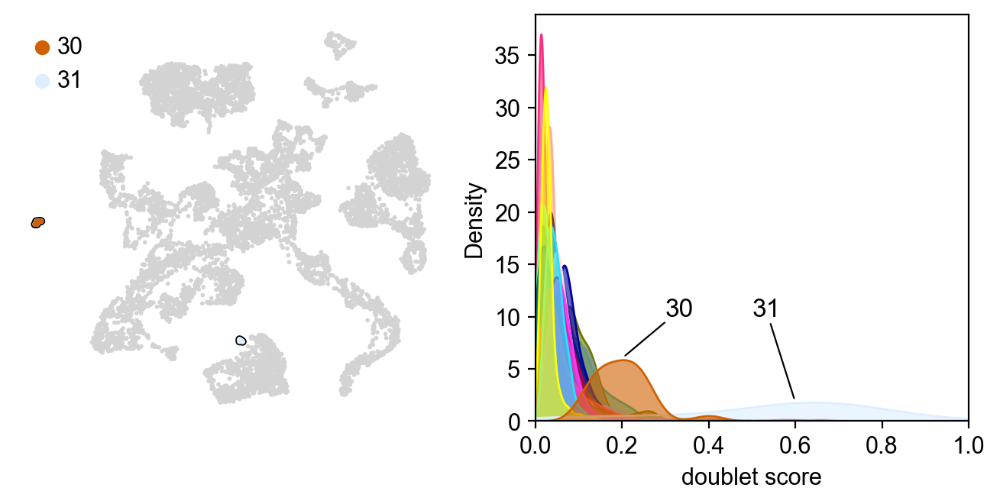

In [13]:
scv.set_figure_params(dpi_save=300,figsize=(3.5,3.5))
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(8,3.5))
scv.pl.umap(adata,color="lightgrey",show=False,ax=ax1)
scv.pl.umap(adata[adata.obs.leiden.isin(["30","31"])],title="",show=False,
            color="leiden",ax=ax1,s=20,add_outline=True,legend_loc="upper left")
sns.kdeplot(x="doublet_scores",hue="leiden",data=adata[~adata.obs.leiden.isin(["30","31"])].obs,common_norm=False,
              fill=True,legend=False,ax=ax2,
             alpha=.6,palette=adata.uns["leiden_colors"][:30].tolist())

sns.kdeplot(x="doublet_scores",hue="leiden",data=adata[adata.obs.leiden.isin(["30","31"])].obs,common_norm=False,
              fill=True,legend=False,palette=adata.uns["leiden_colors"][30:].tolist(),
             alpha=.6,ax=ax2)

ax2.set_xlim([0,1])
ax2.set_xlabel("doublet score")
ax2.annotate("30",xy=(0.2,6),xytext=(.3,10),
             bbox=dict(pad=-1, facecolor="none", edgecolor="none"),
             arrowprops=dict(arrowstyle="-",connectionstyle = 'arc3',linewidth=.8))

ax2.annotate("31",xy=(0.6,1.8),xytext=(.5,10),
             bbox=dict(pad=-1, facecolor="none", edgecolor="none"),
             arrowprops=dict(arrowstyle="-",connectionstyle = 'arc3',linewidth=.8))
plt.savefig('figures/suppfile1_2-B.pdf',bbox_inches="tight")

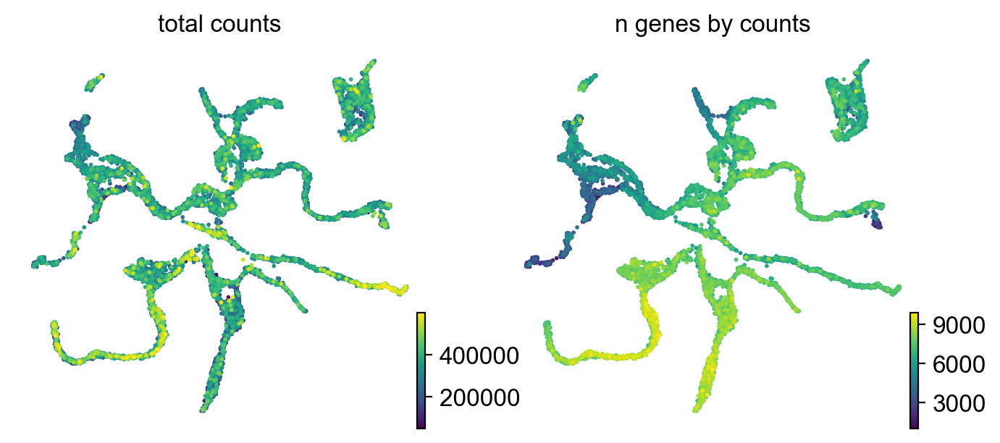

In [14]:
adata=sc.read("data/adata_processed.h5ad")
scv.set_figure_params(dpi_save=300,figsize=(3.5,3.5))

fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(8,3.5))
scv.pl.umap(adata,color="total_counts",cmap="viridis",ax=ax1,show=False,sort_order=True)
scv.pl.umap(adata,color="n_genes_by_counts",cmap="viridis",ax=ax2,show=False,sort_order=True,)
plt.savefig('figures/suppfile1_2-C.pdf',bbox_inches="tight")


In [117]:
%%bash
cat<<EOF >suppfile_1.tex
\documentclass[11pt]{article}
\usepackage{geometry}
 \geometry{
 left=20mm,
 right=20mm,
 top=20mm,
 bottom=20mm,
 }
\usepackage{silence}
\WarningsOff*
\usepackage[labelfont=bf]{caption}


\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\usepackage{svg}

\usepackage{fancyhdr}

\pagestyle{empty}

\begin{document}
\setmainfont{Arial}

\raggedright \textbf{A} Selection strategy for glial population and progenies
\vspace{-7pt}
\begin{center}
\includegraphics[width=0.9\linewidth]{figures/suppfile1_1-A.pdf}
\end{center}
\textbf{B} Main populations composing the overall dataset
\vspace{-13pt}
\begin{center} 
\includegraphics[width=0.9\linewidth]{figures/suppfile1_1-B.pdf}  
\end{center}


\clearpage


\raggedright \textbf{A} General QC of the filtered overiew dataset
\vspace{-10pt}
\begin{center}
\includegraphics[width=.9\linewidth]{figures/suppfile1_2-A.pdf}
\end{center}
\textbf{B} UMAP of filterted glial dataset with two leiden clusters representing contaminations
\vspace{-13pt}
\begin{center} 
\includegraphics[width=1\linewidth]{figures/suppfile1_2-B.pdf}  
\end{center}
\textbf{C} Gene and transcript counts on diffusion processed UMAP embedding of the glial dataset (contamination free)
\vspace{-13pt}
\begin{center} 
\includegraphics[width=1\linewidth]{figures/suppfile1_2-C.pdf}  
\end{center}

\clearpage
EOF

echo "\end{document}" >> suppfile_1.tex

xelatex --shell-escape suppfile_1.tex
rm suppfile_1.aux 
convert -flatten -density 300 suppfile_1.pdf[0] suppfile_1-1.jpg
convert -flatten -density 300 suppfile_1.pdf[1] suppfile_1-2.jpg

identify suppfile_1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./suppfile_1.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size11.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/silence/silence.sty)
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/fontspec/fontspec.sty
(/usr/share/texlive/texmf-dist/tex/latex/l3packages/xparse/xparse.sty
(/usr/share/texlive

In [136]:
%%bash
cat<<EOF >Appendix_1.tex
\documentclass[11pt]{article}
\usepackage{geometry}
 \geometry{
 left=2mm,
 right=2mm,
 top=2mm,
 bottom=2mm,
 }
\usepackage{silence}
\WarningsOff*
\usepackage[labelfont=bf]{caption}


\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\usepackage{svg}

\usepackage{fancyhdr}

\pagestyle{empty}

\begin{document}
\setmainfont{Arial}

\raggedright \textbf{A} Selection strategy for glial population and progenies
\vspace{-7pt}
\begin{center}
\includegraphics[width=.87\linewidth]{figures/suppfile1_1-A.pdf}
\end{center}
\textbf{B} Main populations composing the overall dataset
\vspace{-13pt}
\begin{center} 
\includegraphics[width=.87\linewidth]{figures/suppfile1_1-B.pdf}  
\end{center}

\clearpage
EOF

echo "\end{document}" >> Appendix_1.tex

xelatex --shell-escape Appendix_1.tex
rm Appendix_1.aux 
convert -flatten -density 300 Appendix_1.pdf Appendix_1.jpg


identify Appendix_1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./appendix_1.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size11.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/silence/silence.sty)
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/fontspec/fontspec.sty
(/usr/share/texlive/texmf-dist/tex/latex/l3packages/xparse/xparse.sty
(/usr/share/texlive

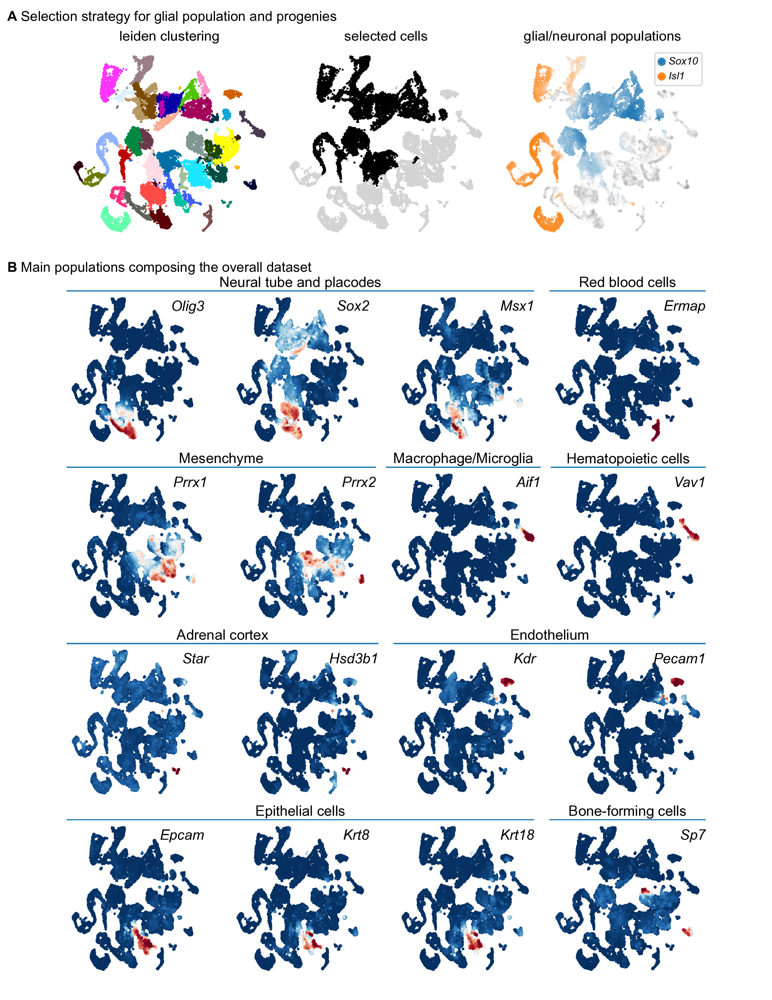

In [137]:
from IPython.display import Image
Image(filename='Appendix_1.jpg') 


In [139]:
%%bash
cat<<EOF >Appendix_2.tex
\documentclass[11pt]{article}
\usepackage{geometry}
 \geometry{
 left=5mm,
 right=5mm,
 top=5mm,
 bottom=5mm,
 }
\usepackage{silence}
\WarningsOff*
\usepackage[labelfont=bf]{caption}


\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\usepackage{svg}

\usepackage{fancyhdr}

\pagestyle{empty}

\begin{document}
\setmainfont{Arial}

\raggedright \textbf{A} General QC of the filtered overiew dataset
\vspace{-10pt}
\begin{center}
\includegraphics[width=.9\linewidth]{figures/suppfile1_2-A.pdf}
\end{center}
\textbf{B} UMAP of filterted glial dataset with two leiden clusters representing contaminations
\vspace{-13pt}
\begin{center} 
\includegraphics[width=.9\linewidth]{figures/suppfile1_2-B.pdf}  
\end{center}
\textbf{C} Gene and transcript counts on diffusion processed UMAP embedding of the glial dataset (contamination free)
\vspace{-13pt}
\begin{center} 
\includegraphics[width=.9\linewidth]{figures/suppfile1_2-C.pdf}  
\end{center}

\clearpage
EOF

echo "\end{document}" >> Appendix_2.tex

xelatex --shell-escape Appendix_2.tex
rm Appendix_2.aux 
convert -flatten -density 300 Appendix_2.pdf Appendix_2.jpg


identify Appendix_2.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./appendix_2.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size11.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/silence/silence.sty)
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/fontspec/fontspec.sty
(/usr/share/texlive/texmf-dist/tex/latex/l3packages/xparse/xparse.sty
(/usr/share/texlive

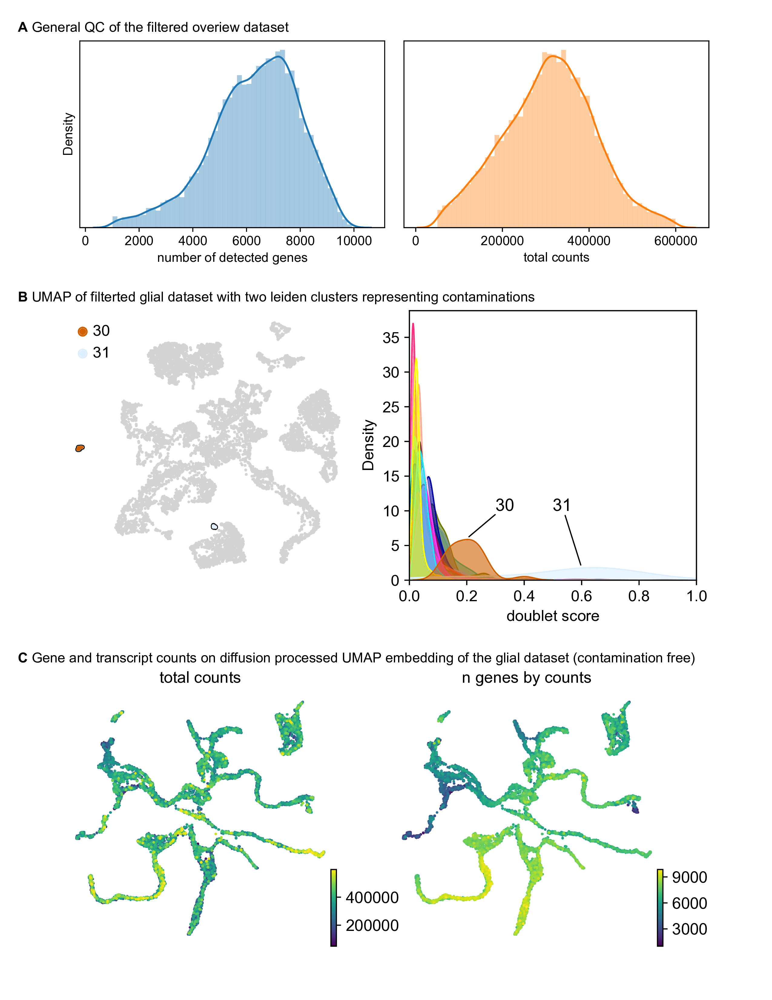

In [140]:
Image(filename='Appendix_2.jpg')  

In [88]:
scv.set_figure_params(figsize=(3,3))
scf.set_figure_pubready()
markers={"BCC":["Prss56","Egr2","Wif1","Hey2"],
    "ChC":["Th","Dbh","Chga","Chgb","Slc18a1","Slc18a2"],
         "enteric glia":["Phox2b","Ctgf","Nfia","Tgfb2","S100b"],
         "enteric neurons":["Ret", "Phox2a", "Chrna3","Sox11"],
         "melanocytes":["Dct","Mitf","Pmel","Tyr"],
         "mesenchyme":["Prrx1","Prrx2","Pdgfra"],
         "neural crest":["Sox9","Wnt1","Ets1","Snai1","Gfra1"],
         "SC":["Mpz","Plp1","Fbxo7","Gjc3","Pmp22","Dhh","Mal"],
         "satellite glia":["Fabp7","Ptn","Rgcc"],
         "sensory neurons":["Prdm12","Isl2","Pou4f1","Six1"],
         "sympathetic neurons":["Cartpt","Prph","Mapt","Maoa"],
         "endoneurial\nfibroblasts":["Lum","Dcn","Fbn1","Cd34", "Sox9", "Dlk1", "Fn1","Pdgfra","Pdgfrb"],
         }

In [89]:
adata=sc.read("data/adata_assigned.h5ad")

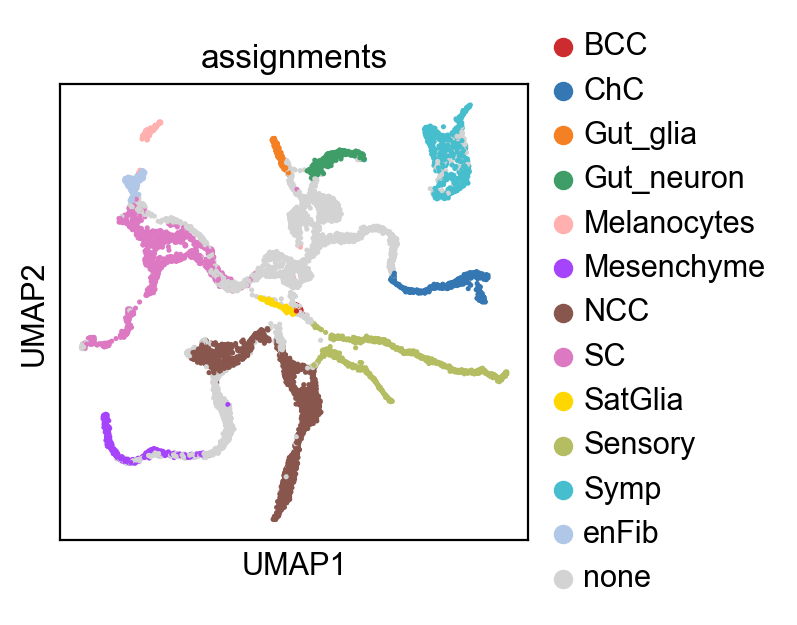

In [90]:
sc.pl.umap(adata,color="assignments")

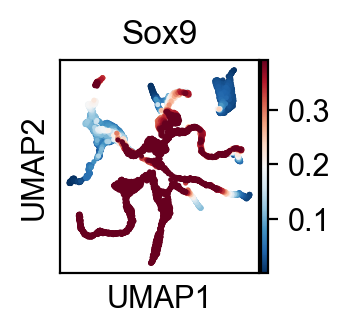

In [114]:
sc.pl.umap(adata,color="Sox9",layer="palantir_imp",vmax="p50")

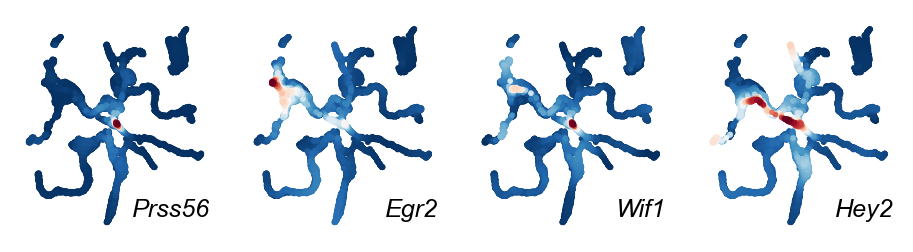

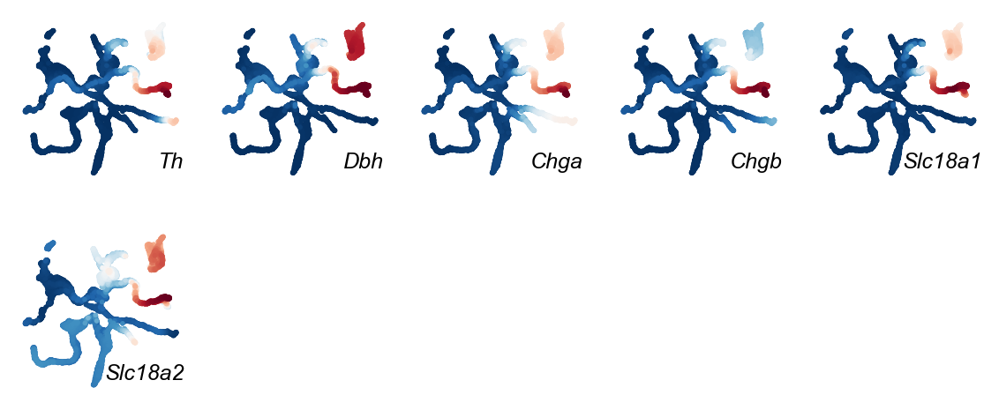

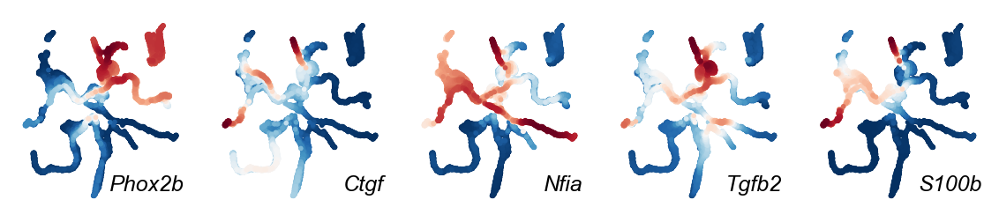

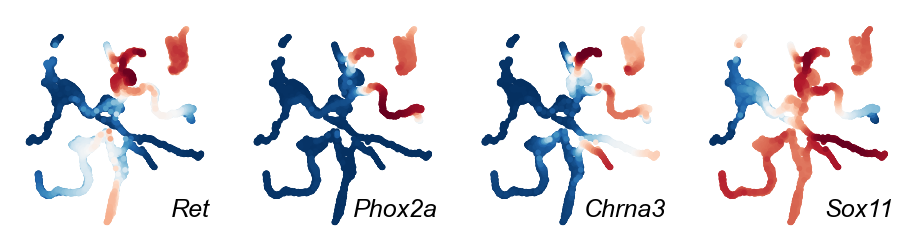

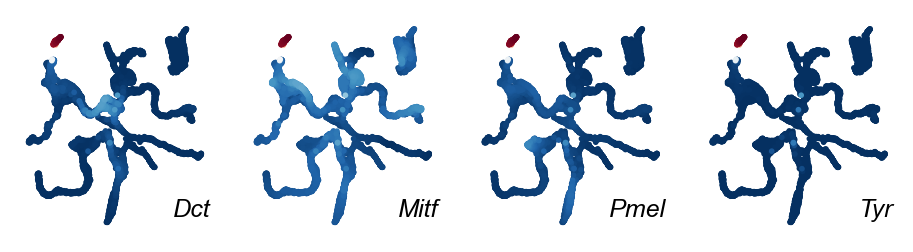

...

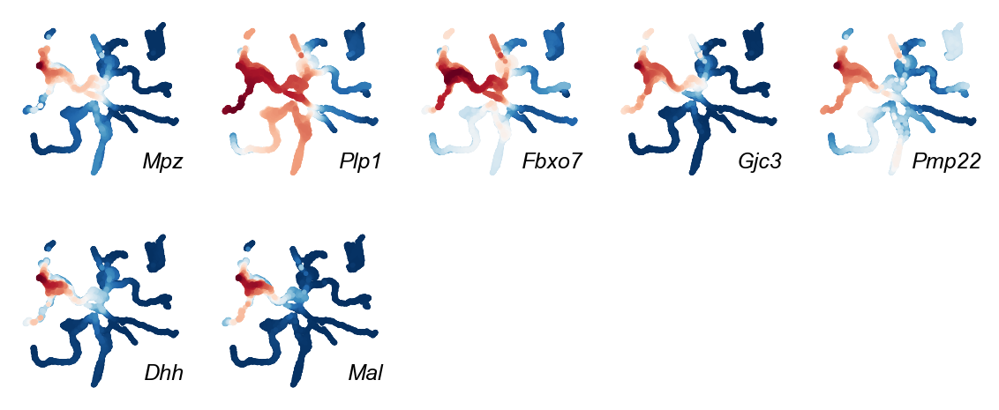

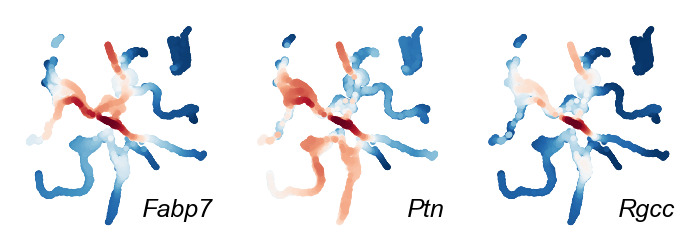

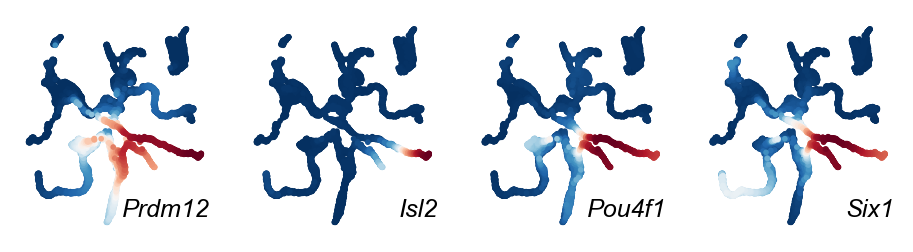

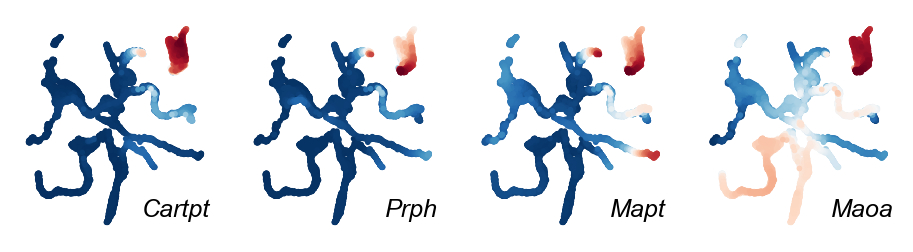

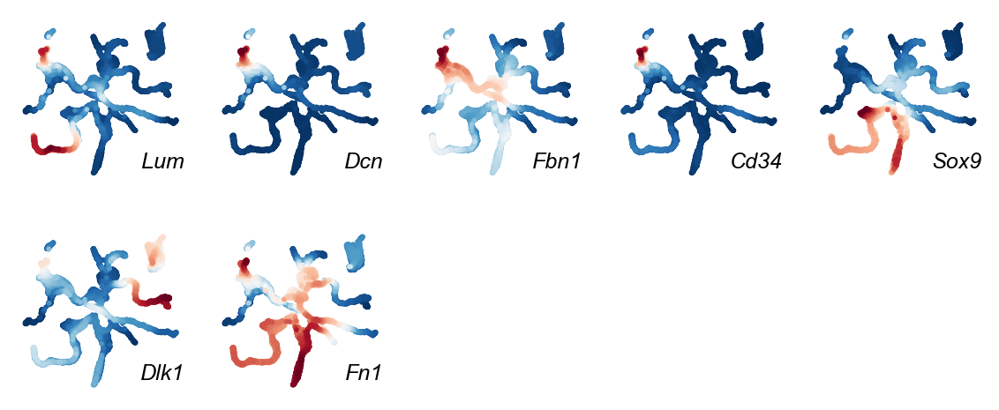

In [91]:
scv.set_figure_params(figsize=(1.4,1.4))
for m,gs in markers.items():
    axs=scv.pl.umap(adata,color=gs,ncols=5,layer="palantir_imp",title="",colorbar=False,show=False)
    for g,ax in zip(gs,axs):
        ax.text(1, 0.05,g,fontsize= 9,
            va="bottom", ha="right", transform=ax.transAxes,
            fontdict={"fontstyle":"italic"})
    plt.savefig(f"figures/{m}_markers.pdf",dpi=300)

In [105]:
%%bash
cat<<EOF >Appendix_3.tex
\documentclass[11pt]{article}
\usepackage{geometry}
 \geometry{
 left=20mm,
 right=20mm,
 top=20mm,
 bottom=20mm,
 }
\usepackage{silence}
\WarningsOff*
\usepackage[labelfont=bf]{caption}


\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphicx} 
\usepackage{svg}

\usepackage{fancyhdr}

\pagestyle{empty}

\begin{document}
\setmainfont{Arial}

\raggedright \includegraphics[width=0.8\linewidth]{figures/BCC_markers.pdf}
\includegraphics[width=1\linewidth]{figures/ChC_markers.pdf}
\includegraphics[width=1\linewidth]{figures/enteric glia_markers.pdf}
\includegraphics[width=.8\linewidth]{figures/enteric neurons_markers.pdf}
\includegraphics[width=.8\linewidth]{figures/melanocytes_markers.pdf}
\includegraphics[width=.6\linewidth]{figures/mesenchyme_markers.pdf}
\includegraphics[width=1\linewidth]{figures/neural crest_markers.pdf}
\includegraphics[width=1\linewidth]{figures/SC_markers.pdf}
\includegraphics[width=.6\linewidth]{figures/satellite glia_markers.pdf}
\includegraphics[width=.8\linewidth]{figures/sensory neurons_markers.pdf}
\includegraphics[width=.8\linewidth]{figures/sympathetic neurons_markers.pdf}
\includegraphics[width=1\linewidth]{figures/endoneurialfibroblasts_markers.pdf}

\clearpage
EOF

echo "\end{document}" >> Appendix_3.tex

xelatex --shell-escape Appendix_3.tex
rm Appendix_3.aux 
convert -flatten -density 300 Appendix_3.pdf[0] Appendix_3_1.jpg
convert -flatten -density 300 Appendix_3.pdf[1] Appendix_3_2.jpg
convert -flatten -density 300 Appendix_3.pdf[2] Appendix_3_3.jpg


identify Appendix_3.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./appendix_3.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size11.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/silence/silence.sty)
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/fontspec/fontspec.sty
(/usr/share/texlive/texmf-dist/tex/latex/l3packages/xparse/xparse.sty
(/usr/share/texlive

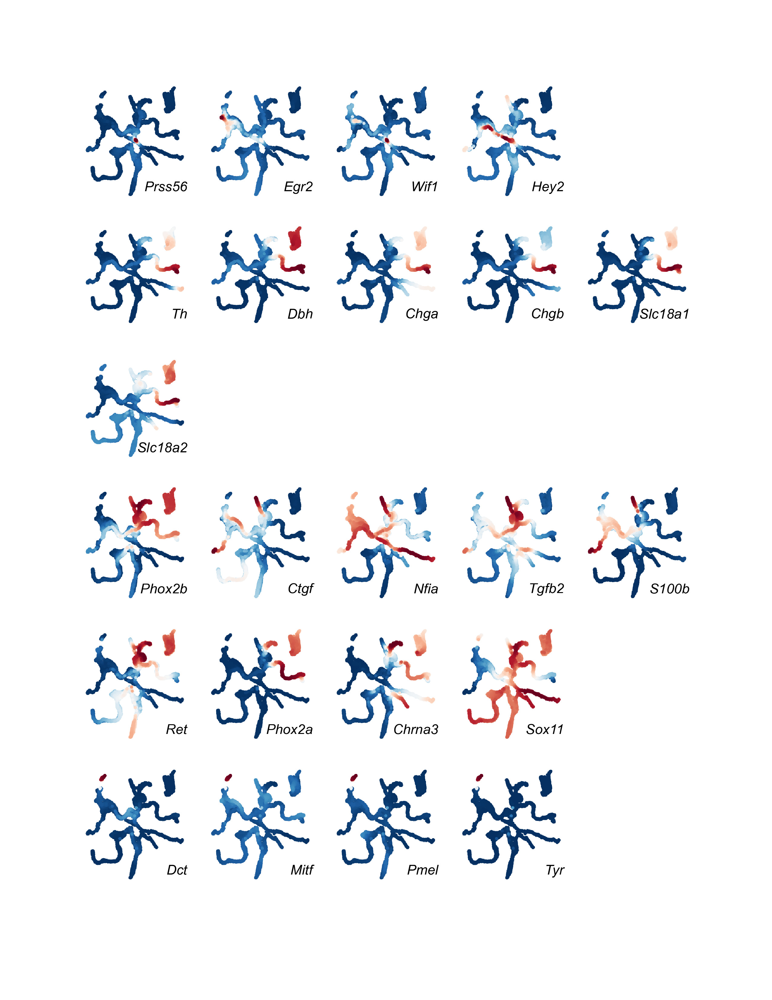

In [106]:
Image(filename='Appendix_3_1.jpg')  

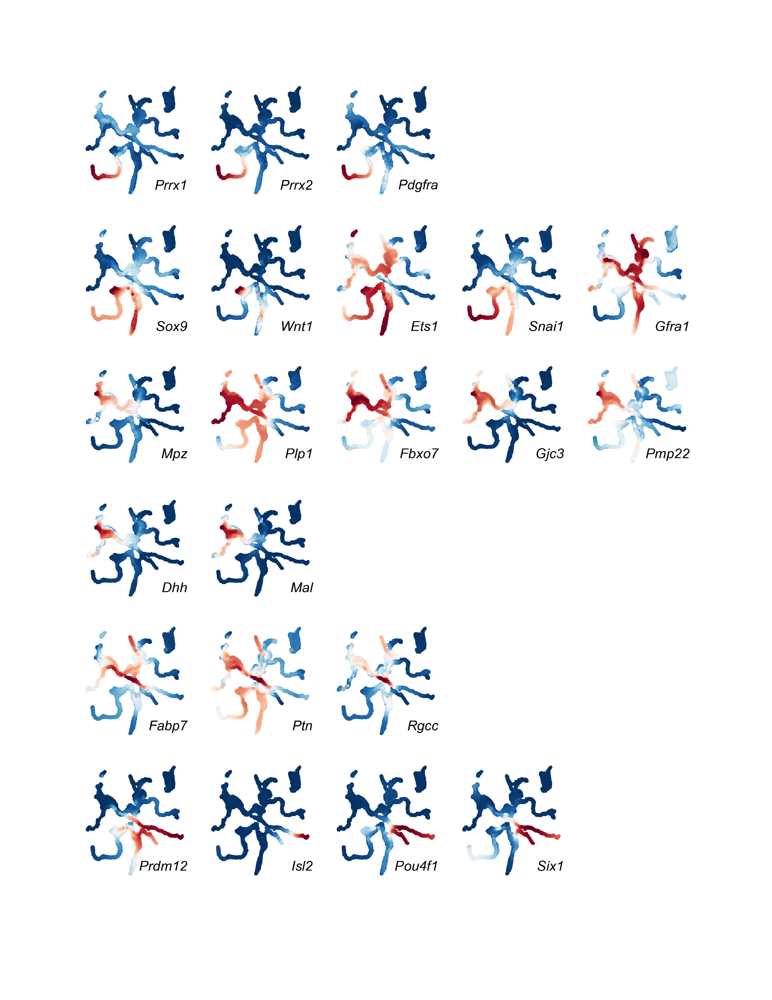

In [107]:
Image(filename='Appendix_3_2.jpg')  

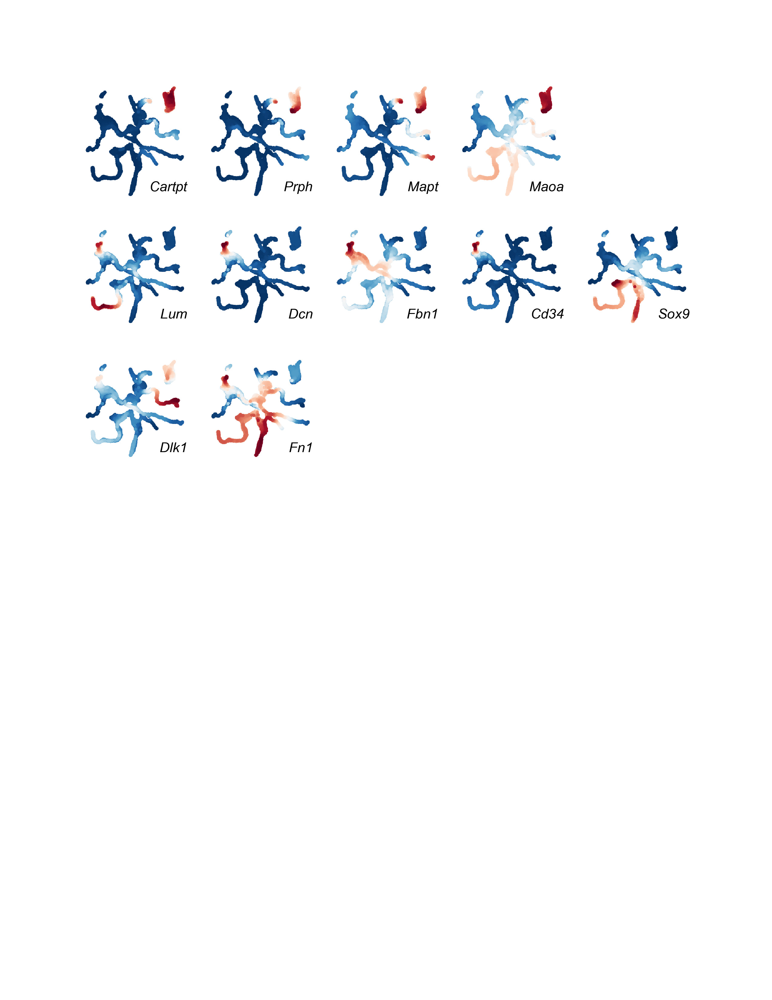

In [108]:
Image(filename='Appendix_3_3.jpg')  